In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("C:/Users/Vince Misalucha/Downloads/sell_coordinates/sell_1802.csv")
df.head()

,id,operation,property_type,place_name,state_name,lat,lon,surface_covered_in_m2,floor,rooms,price
0,642177c66e5cd1f39af9887fd68788de3ec84870,sell,apartment,Aquiraz,Ceará,-3.838596,-38.395409,37,3,1,200000.0
1,a7a391546a4f46f8a707861aae721e21364c308b,sell,apartment,Aquiraz,Ceará,-3.838382,-38.395873,37,3,1,180000.0
2,f1702ed50626c84fb2dc9dcf50bcc2f2557c8aa3,sell,apartment,Aquiraz,Ceará,-3.838617,-38.395390,56,3,2,380000.0
3,fd667e7524131792b76dfdaddad12c30c8280b71,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,135,3,3,350000.0
4,c9807d1b79ebd399fa16e822631dcf0a2866f14f,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,65,2,1,185000.0


In [3]:
import folium
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap

In [4]:
states = sorted(list(df['state_name'].unique()))
states

['Bahia',
 'Ceará',
 'Espírito Santo',
 'Goiás',
 'Paraná',
 'Rio Grande do Sul',
 'Rio de Janeiro',
 'Santa Catarina',
 'São Paulo']

In [5]:
p_type = sorted(list(df['property_type'].unique()))
p_type

['apartment', 'house', 'store']

In [6]:
br_apt = df[(df.property_type == 'apartment')]
br_apt ['price_quartile'] = pd.qcut(br_apt['price'], 4, labels=False)
br_apt ['size_percentile'] = pd.qcut(br_apt['surface_covered_in_m2'], 10, labels=False)
br_apt

C:\Anaconda3\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Anaconda3\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,id,operation,property_type,place_name,state_name,lat,lon,surface_covered_in_m2,floor,rooms,price,price_quartile,size_percentile
0,642177c66e5cd1f39af9887fd68788de3ec84870,sell,apartment,Aquiraz,Ceará,-3.838596,-38.395409,37,3,1,200000.0,0,0
1,a7a391546a4f46f8a707861aae721e21364c308b,sell,apartment,Aquiraz,Ceará,-3.838382,-38.395873,37,3,1,180000.0,0,0
2,f1702ed50626c84fb2dc9dcf50bcc2f2557c8aa3,sell,apartment,Aquiraz,Ceará,-3.838617,-38.395390,56,3,2,380000.0,0,2
3,fd667e7524131792b76dfdaddad12c30c8280b71,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,135,3,3,350000.0,0,7
4,c9807d1b79ebd399fa16e822631dcf0a2866f14f,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,65,2,1,185000.0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7100,443d752f5d7527d5f3e31ac4f7281d2eeafdccdc,sell,apartment,Recreio dos Bandeirantes,Rio de Janeiro,-23.028583,-43.467500,275,3,1,1550000.0,2,9
7101,ef2589e813cc4f6bf418be161dc2c0ff026cc4bb,sell,apartment,Recreio dos Bandeirantes,Rio de Janeiro,-23.030253,-43.475457,105,23,1,780000.0,1,6
7102,d90d038f163f33ad57c6b405f42629688520c1e1,sell,apartment,Ingleses do Rio Vermelho,Santa Catarina,-27.431759,-48.405364,78,2,2,291000.0,0,3
7103,cc92c73daa05643835a804102487d9eb89dee524,sell,apartment,Ingleses do Rio Vermelho,Santa Catarina,-27.428489,-48.407484,66,1,2,260000.0,0,2


## Apartment Volume per State

In [7]:
import matplotlib.pyplot as plt

In [8]:
vol_apt = br_apt.groupby('state_name')['id'].count().sort_values(ascending=False)
pd.DataFrame(vol_apt)

,id
state_name,
Rio de Janeiro,6436
São Paulo,125
Goiás,106
Santa Catarina,84
Paraná,10
Ceará,10
Bahia,9
Rio Grande do Sul,7
Espírito Santo,2


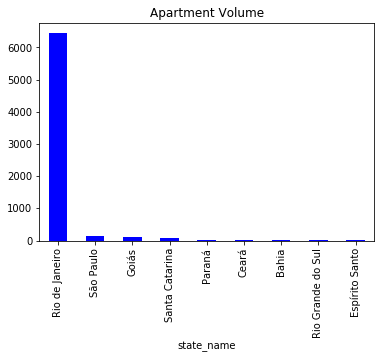

In [9]:
vol_apt.plot(kind='bar', color = 'blue', title = 'Apartment Volume')

## Apartment Average Price per State

In [10]:
price_apt = br_apt.groupby('state_name')['price'].mean().sort_values(ascending=False)
pd.DataFrame(price_apt.round(2))

,price
state_name,
Rio de Janeiro,1445539.64
São Paulo,913592.00
Santa Catarina,839386.90
Ceará,684943.80
Goiás,534764.15
Rio Grande do Sul,494285.71
Bahia,460555.56
Paraná,442500.00
Espírito Santo,410000.00


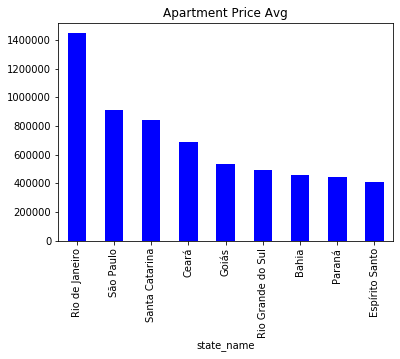

In [11]:
price_apt.plot(kind='bar', color='blue', title='Apartment Price Avg')

## Correlation of Numerical Features

In [12]:
import seaborn as sns

In [13]:
br_num_features = br_apt.iloc[:, 5:-2]
br_num_features.corr()

,lat,lon,surface_covered_in_m2,floor,rooms,price
lat,1.000000,0.022591,-0.009909,0.073397,0.096309,-0.038786
lon,0.022591,1.000000,-0.010605,0.057375,-0.287277,0.084386
surface_covered_in_m2,-0.009909,-0.010605,1.000000,0.006778,0.338234,0.756377
floor,0.073397,0.057375,0.006778,1.000000,-0.002624,-0.000925
rooms,0.096309,-0.287277,0.338234,-0.002624,1.000000,0.182658
price,-0.038786,0.084386,0.756377,-0.000925,0.182658,1.000000


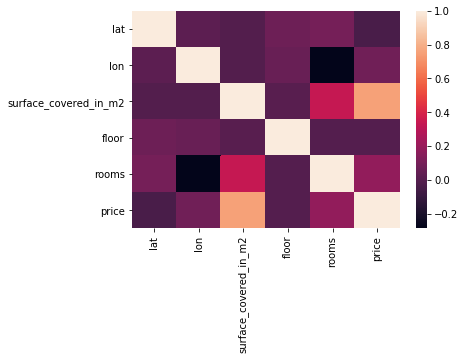

In [14]:
sns.heatmap(br_num_features.corr());

## Interactive Magnitude Marker Map

In [57]:
colordict = {0: 'blue', 1: 'green', 2: 'orange', 3: 'red'}
sizedict = {0: 4.5, 1: 5, 2: 5.5, 3: 6, 4: 6.5, 5: 7, 6: 7.5, 7: 8, 8: 8.5, 9: 9, 10: 9.5 }
def cmarker_map(data, init_lat, init_lon):
    
    map_out = folium.Map(location=[init_lat, init_lon], zoom_start = 5)
    for id, lat, lon, place, state, price_q, size, size_per, price in zip(data['id'], data['lat'], data['lon'], data['place_name'], data['state_name'],
                                                data['price_quartile'], data['surface_covered_in_m2'], data['size_percentile'], data['price']):
        folium.CircleMarker(
            [lat, lon],
            radius= sizedict[size_per],
            popup = ('Place: ' + str(place) + '<br>'
                     'State: ' + str(state) + '<br>'
                     'Price: ' + 'BRL' + str(price) + '<br>'
                     'SqM: ' + str(size) + '<br>'
                     'XY: ' + str(lat)+',' + str(lon) + '<br>'
                     'ID: ' + str(id) + '<br>'
                    ),
            
            color='b',
            key_on = size_per,
            threshold_scale=[0,1,2,3],
            fill_color=colordict[price_q],
            fill=True,
            fill_opacity=0.8
        ).add_to(map_out)
    
    return map_out

In [58]:
apt_map = cmarker_map(br_apt, -16.6869, -49.2648)
apt_map

#### Data Description:
Dataset: Listing of Apartments in Brazil 

States: Bahia, Ceará, Espírito Santo, Goiás, Paraná, Rio Grande do Sul, Rio de Janeiro, Santa Catarina, and São Paulo

Time: February 2018 (latest)

#### Legend:
Color: Price Ascending (Blue, Green, Orange, Red)

Radius: Size (Sq. Meters) scaled to percentile, 10 different sizes

In [59]:
apt_map.save("apartment_map.html")

In [17]:
q_apt = br_apt.copy()

In [18]:
q_apt['price_quartile'] = pd.qcut(q_apt['price'], 4, labels=False)

In [19]:
q1_apt_price = q_apt[q_apt.price_quartile == 0].groupby('state_name')['price'].mean().sort_values(ascending=False)
pd.DataFrame(q1_apt_price.round(2))

,price
state_name,
Rio de Janeiro,421738.89
Espírito Santo,410000.00
São Paulo,364018.18
Bahia,343571.43
Goiás,331000.00
Paraná,315625.00
Rio Grande do Sul,304000.00
Santa Catarina,296670.21
Ceará,253333.33


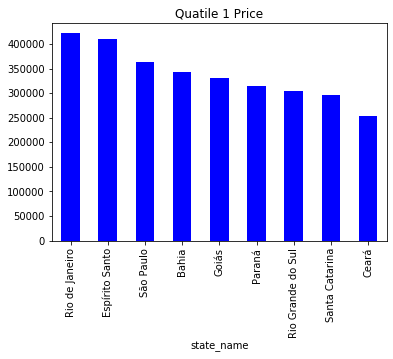

In [20]:
q1_apt_price.plot(kind='bar', color='blue', title='Quatile 1 Price')

In [21]:
q1_apt_size = q_apt[q_apt.price_quartile == 0].groupby('state_name')['surface_covered_in_m2'].mean().sort_values(ascending=False)
pd.DataFrame(q1_apt_size.round(2))

,surface_covered_in_m2
state_name,
Paraná,127.00
Espírito Santo,100.00
Bahia,89.86
Goiás,83.33
Santa Catarina,76.34
São Paulo,67.91
Rio Grande do Sul,58.80
Rio de Janeiro,51.11
Ceará,43.33


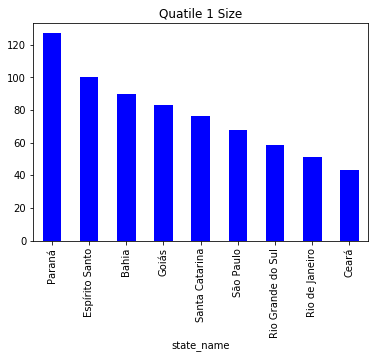

In [22]:
q1_apt_size.plot(kind='bar', color='blue', title='Quatile 1 Size')

In [23]:
q2_apt_price = q_apt[q_apt.price_quartile == 1].groupby('state_name')['price'].mean().sort_values(ascending=False)
pd.DataFrame(q2_apt_price.round(2))

,price
state_name,
Santa Catarina,817142.86
Rio de Janeiro,796889.46
Goiás,794736.84
Ceará,759000.00
Paraná,750000.00
São Paulo,745742.86
Rio Grande do Sul,690000.00
Bahia,690000.00


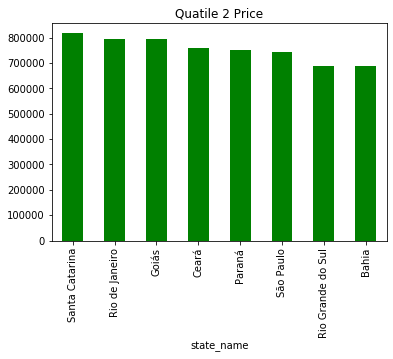

In [24]:
q2_apt_price.plot(kind='bar', color='green', title='Quatile 2 Price')

In [25]:
q2_apt_size = q_apt[q_apt.price_quartile == 1].groupby('state_name')['surface_covered_in_m2'].mean().sort_values(ascending=False)
pd.DataFrame(q2_apt_size.round(2))

,surface_covered_in_m2
state_name,
Goiás,166.00
Bahia,164.00
Paraná,150.00
Santa Catarina,141.14
Rio Grande do Sul,134.00
São Paulo,88.94
Ceará,88.80
Rio de Janeiro,77.29


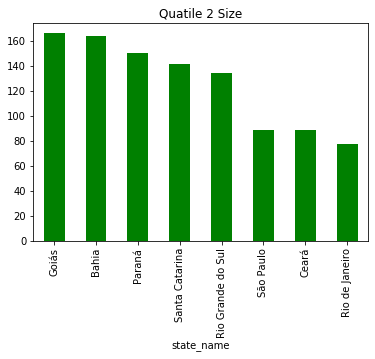

In [26]:
q2_apt_size.plot(kind='bar', color='green', title='Quatile 2 Size')

In [27]:
q3_apt_price = q_apt[q_apt.price_quartile == 2].groupby('state_name')['price'].mean().sort_values(ascending=False)
pd.DataFrame(q3_apt_price.round(2))

,price
state_name,
São Paulo,1276684.21
Rio de Janeiro,1266763.68
Rio Grande do Sul,1250000.00
Santa Catarina,1237272.73
Goiás,1186000.00
Paraná,1150000.00
Ceará,1147219.00
Bahia,1050000.00


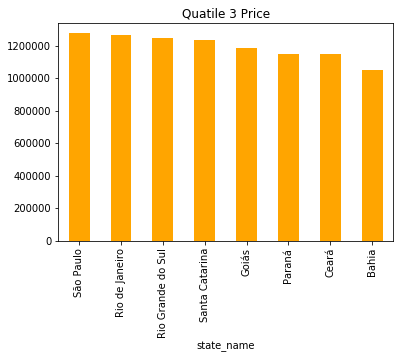

In [28]:
q3_apt_price.plot(kind='bar', color='Orange', title='Quatile 3 Price')

In [29]:
q3_apt_size = q_apt[q_apt.price_quartile == 2].groupby('state_name')['surface_covered_in_m2'].mean().sort_values(ascending=False)
pd.DataFrame(q3_apt_size.round(2))

,surface_covered_in_m2
state_name,
Paraná,280.00
Goiás,200.90
Rio Grande do Sul,192.00
Santa Catarina,160.00
Ceará,154.00
São Paulo,152.58
Bahia,129.00
Rio de Janeiro,106.46


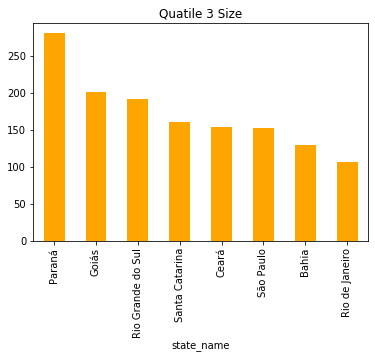

In [30]:
q3_apt_size.plot(kind='bar', color='orange', title='Quatile 3 Size')

In [31]:
q4_apt_price = q_apt[q_apt.price_quartile == 3].groupby('state_name')['price'].mean().sort_values(ascending=False)
pd.DataFrame(q4_apt_price.round(2))

,price
state_name,
Rio de Janeiro,3205456.23
São Paulo,2738750.00
Santa Catarina,2626250.00
Goiás,2450000.00


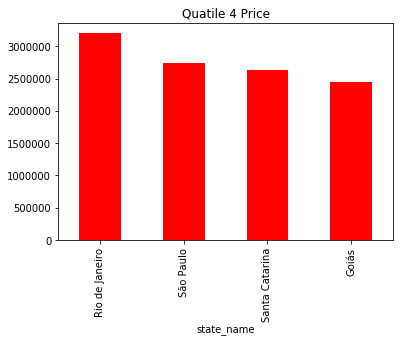

In [32]:
q4_apt_price.plot(kind='bar', color='red', title='Quatile 4 Price')

In [33]:
q4_apt_size = q_apt[q_apt.price_quartile == 3].groupby('state_name')['surface_covered_in_m2'].mean().sort_values(ascending=False)
pd.DataFrame(q4_apt_size.round(2))

,surface_covered_in_m2
state_name,
Goiás,330.50
São Paulo,230.75
Santa Catarina,227.33
Rio de Janeiro,200.19


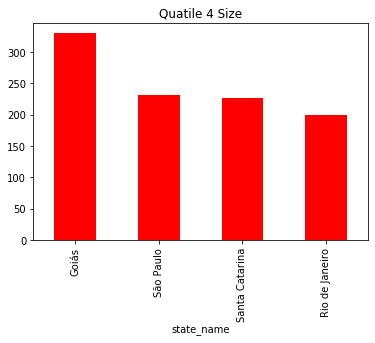

In [34]:
q4_apt_size.plot(kind='bar', color='red', title='Quatile 4 Size')

## Price per SQM

In [35]:
q_apt['price_per_sqm'] = round(q_apt['price']/q_apt['surface_covered_in_m2'], 2)
q_apt

,id,operation,property_type,place_name,state_name,lat,lon,surface_covered_in_m2,floor,rooms,price,price_quartile,size_percentile,price_per_sqm
0,642177c66e5cd1f39af9887fd68788de3ec84870,sell,apartment,Aquiraz,Ceará,-3.838596,-38.395409,37,3,1,200000.0,0,0,5405.41
1,a7a391546a4f46f8a707861aae721e21364c308b,sell,apartment,Aquiraz,Ceará,-3.838382,-38.395873,37,3,1,180000.0,0,0,4864.86
2,f1702ed50626c84fb2dc9dcf50bcc2f2557c8aa3,sell,apartment,Aquiraz,Ceará,-3.838617,-38.395390,56,3,2,380000.0,0,2,6785.71
3,fd667e7524131792b76dfdaddad12c30c8280b71,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,135,3,3,350000.0,0,7,2592.59
4,c9807d1b79ebd399fa16e822631dcf0a2866f14f,sell,apartment,Santa Catarina,Santa Catarina,-27.242339,-50.218856,65,2,1,185000.0,0,2,2846.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7100,443d752f5d7527d5f3e31ac4f7281d2eeafdccdc,sell,apartment,Recreio dos Bandeirantes,Rio de Janeiro,-23.028583,-43.467500,275,3,1,1550000.0,2,9,5636.36
7101,ef2589e813cc4f6bf418be161dc2c0ff026cc4bb,sell,apartment,Recreio dos Bandeirantes,Rio de Janeiro,-23.030253,-43.475457,105,23,1,780000.0,1,6,7428.57
7102,d90d038f163f33ad57c6b405f42629688520c1e1,sell,apartment,Ingleses do Rio Vermelho,Santa Catarina,-27.431759,-48.405364,78,2,2,291000.0,0,3,3730.77
7103,cc92c73daa05643835a804102487d9eb89dee524,sell,apartment,Ingleses do Rio Vermelho,Santa Catarina,-27.428489,-48.407484,66,1,2,260000.0,0,2,3939.39


In [36]:
q_apt_bah = q_apt[q_apt.state_name=='Bahia']
q_apt_cea = q_apt[q_apt.state_name=='Ceará']
q_apt_es = q_apt[q_apt.state_name=='Espírito Santo']
q_apt_goi = q_apt[q_apt.state_name=='Goiás']
q_apt_par = q_apt[q_apt.state_name=='Paraná']
q_apt_rgds = q_apt[q_apt.state_name=='Rio Grande do Sul']
q_apt_rdj = q_apt[q_apt.state_name=='Rio de Janeiro']
q_apt_sc = q_apt[q_apt.state_name=='Santa Catarina']
q_apt_sp = q_apt[q_apt.state_name=='São Paulo']

In [37]:
q1_apt_psqm = q_apt[q_apt.price_quartile == 0].groupby('state_name')['price_per_sqm'].mean().sort_values(ascending=False)
pd.DataFrame(q1_apt_psqm.round(2))

,price_per_sqm
state_name,
Rio de Janeiro,9674.19
São Paulo,6035.01
Ceará,5685.33
Rio Grande do Sul,5177.96
Espírito Santo,4131.31
Santa Catarina,4096.49
Goiás,4067.42
Bahia,3991.71
Paraná,2536.82


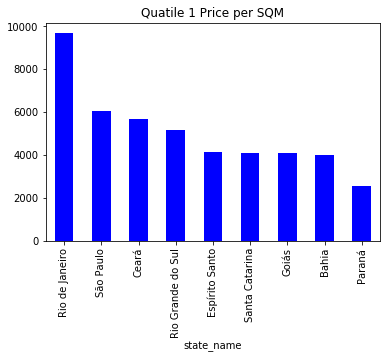

In [38]:
q1_apt_psqm.plot(kind='bar', color='blue', title='Quatile 1 Price per SQM')

In [39]:
q2_apt_psqm = q_apt[q_apt.price_quartile == 1].groupby('state_name')['price_per_sqm'].mean().sort_values(ascending=False)
pd.DataFrame(q2_apt_psqm.round(2))

,price_per_sqm
state_name,
Rio de Janeiro,11455.52
São Paulo,9438.44
Ceará,8631.81
Santa Catarina,6408.98
Rio Grande do Sul,5149.25
Paraná,5000.00
Goiás,4881.51
Bahia,4207.32


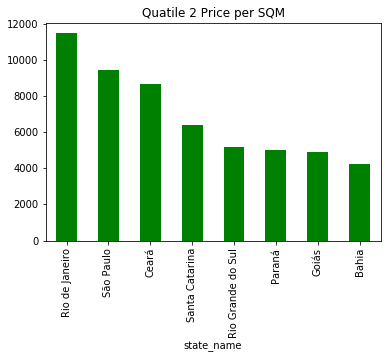

In [40]:
q2_apt_psqm.plot(kind='bar', color='green', title='Quatile 2 Price per SQM')

In [41]:
q3_apt_psqm = q_apt[q_apt.price_quartile == 2].groupby('state_name')['price_per_sqm'].mean().sort_values(ascending=False)
pd.DataFrame(q3_apt_psqm.round(2))

,price_per_sqm
state_name,
Rio de Janeiro,12913.06
São Paulo,9066.04
Santa Catarina,8302.90
Bahia,8139.53
Ceará,7471.90
Rio Grande do Sul,6510.42
Goiás,5977.38
Paraná,4107.14


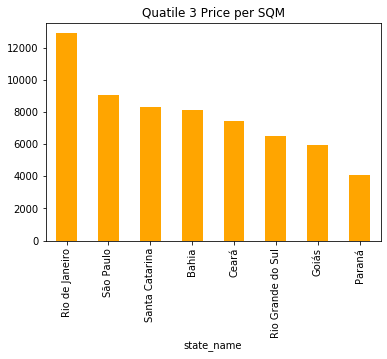

In [42]:
q3_apt_psqm.plot(kind='bar', color='orange', title='Quatile 3 Price per SQM')

In [43]:
q4_apt_psqm = q_apt[q_apt.price_quartile == 3].groupby('state_name')['price_per_sqm'].mean().sort_values(ascending=False)
pd.DataFrame(q4_apt_psqm.round(2))

,price_per_sqm
state_name,
Rio de Janeiro,16760.94
Santa Catarina,12046.84
São Paulo,11636.48
Goiás,7433.96


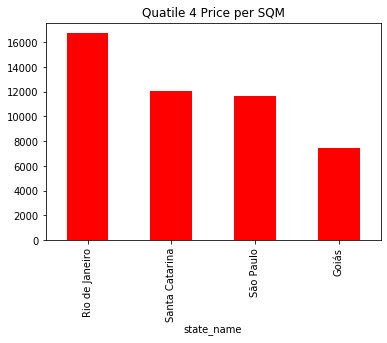

In [44]:
q4_apt_psqm.plot(kind='bar', color='red', title='Quatile 4 Price per SQM')

In [45]:
br_apt[(br_apt.state_name == 'Espírito Santo')]

,id,operation,property_type,place_name,state_name,lat,lon,surface_covered_in_m2,floor,rooms,price,price_quartile,size_percentile
64,fc3095ad020647224303cd50c1607908e6068416,sell,apartment,Guarapari,Espírito Santo,-20.654932,-40.489136,110,6,3,420000.0,0,6
65,47ddab3ede4a17d042a713cf9d0764d1f0ca44fd,sell,apartment,Guarapari,Espírito Santo,-20.663148,-40.498895,90,6,2,400000.0,0,4
